In [130]:
Потренируем навыки, полученные на практическом занятии.
​
Пользуясь новыми знаниями, проведите эксплоративный анализ данных на данных недвижимости Бостона, и попытайтесь обучить линейную модель наиболее качественно. Все ваши действия и решения описывайте в markdown.
​
Данные вы сможете получить исполнив следующий код:
from sklearn.datasets import load_boston
import pandas as pd
data = pd.read_csv(load_boston()[‘filename’], skiprows=1)
​
Переменная, которую надо предсказать - ’MEDV’.
​
Прочитать информацию о содержимом датасета:
print(load_boston()[‘DESCR’])
​
Если вы неудовлетворенны результатом, но лучшего решения предложить не можете, то высылайте задание на проверку.
Цель задания - закрепить полученные навыки.

SyntaxError: invalid syntax (<ipython-input-130-0e080c29a2f2>, line 1)

In [62]:
from sklearn.datasets import load_boston
import pandas as pd
data = pd.read_csv(load_boston()['filename'], skiprows=1)

In [63]:
print(load_boston()['DESCR'])

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

### Начало

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
import numpy as np

%matplotlib inline

In [65]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    int64  
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


In [66]:
data.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677082,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [6]:
data.profile_report()

Поверхностный осмотр показывает, что:
- нулевые значения в выборке отсутствуют, все строки заполнены
- категориальные значения в выборке отсутствуют
- profile_report выделил высокую корреляцию между признаками TAX и RAD, стоит посмотреть смысл этих показателей. Возможно один убрать
- признак ZN содержит 73,5% нулевых значений

### Рассмотрим признаки в отдельности с позиции важности для построения модели линейной регрессии:

CRIM - рейтинг преступлености по городам на душу населения. 

Сам по себе показатель звучит важно и его необходимо остваить для предсказаний. :) 

Видим очень большой размах между минимальным и максимальным значением 0,006 - 88, 976
Посмотрим распределение и частотный график признака на предмет выбросов.

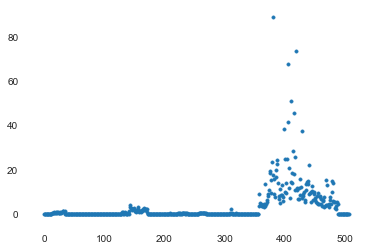

In [67]:
len_column = len(data['CRIM'])
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data['CRIM'], marker='.')

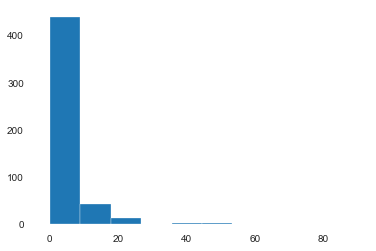

In [68]:
# plt.figure(figsize=(10,16))
plt.hist(data['CRIM'])
plt.show()

На графике заметны выбивающиеся или аномалии/уникальные значения с очень высоким уровнем преступности. Посчитаем, что это нетипичная ситуация и попробуем исключить её влияние. 

Проведем нормализацию признаков и уберем их. Для этого в качестве выбросов примем значения свыше 60. 

In [69]:
# data_norm = data[(data['CRIM'] < data['CRIM'].quantile(0.99)) & (data['CRIM'] > data['CRIM'].quantile(0.00))]
data_norm = data[(data['CRIM'] < 60)]

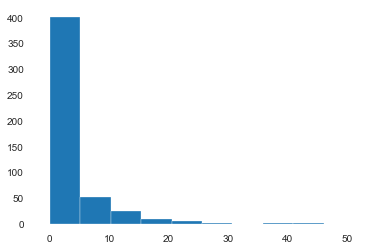

In [70]:
# plt.figure(figsize=(10,16))
plt.hist(data_norm['CRIM'])
plt.show()

In [71]:
data_norm.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000
mean,3.176962,11.431412,11.095249,0.069583,0.553942,6.285123,68.403579,3.808444,9.463221,406.699801,18.445129,357.214195,12.607634,22.619085
std,6.461078,23.375438,6.859608,0.254695,0.115808,0.703389,28.143312,2.104749,8.661067,167.854339,2.167188,90.271083,7.135629,9.154425
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.081930,0.000000,5.160000,0.000000,0.449000,5.886000,44.700000,2.105250,4.000000,279.000000,17.350000,375.425000,6.925000,17.100000
50%,0.253560,0.000000,9.690000,0.000000,0.538000,6.209000,77.000000,3.215700,5.000000,330.000000,19.000000,391.450000,11.320000,21.200000
75%,3.551845,12.500000,18.100000,0.000000,0.624000,6.622000,93.950000,5.213250,24.000000,666.000000,20.200000,396.220000,16.820000,25.000000
max,51.135800,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


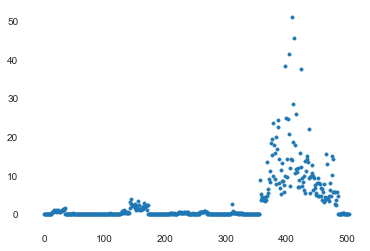

In [72]:
len_column = len(data_norm['CRIM']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['CRIM'], marker='.')

Перейдем к следлующему признаку. 

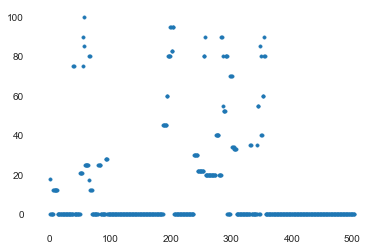

In [73]:
len_column = len(data_norm['ZN']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['ZN'], marker='.')

Очевидно, что этот признак несет информацию о пропорции для участков свыше 25 000 квадратных футов, но не позволяет компьютеру получить эту информацию. Оставим сам показатель, но добавим "флаг" 1 для ненулевых значений. 

In [74]:
data_norm.loc[:, 'more_then_25k_sqft'] = data_norm.ZN.apply(lambda x: 1 if (x!=0) else 0)

C:\Users\econo\AppData\Roaming\Python\Python37\site-packages\pandas\core\indexing.py:845: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\econo\AppData\Roaming\Python\Python37\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


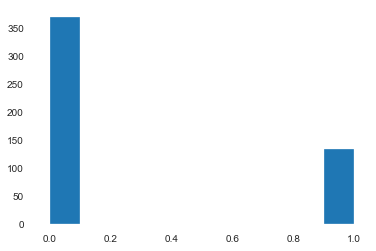

In [75]:
# plt.figure(figsize=(10,16))
plt.hist(data_norm['more_then_25k_sqft'])
plt.show()

Перейдем к следующему признаку. 

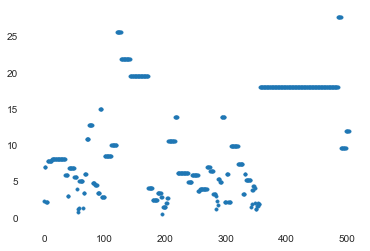

In [76]:
len_column = len(data_norm['INDUS']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['INDUS'], marker='.')

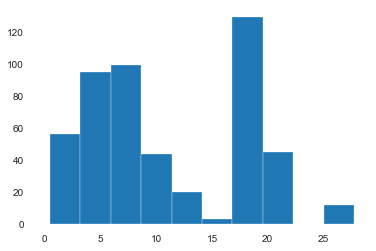

In [77]:
# plt.figure(figsize=(10,16))
plt.hist(data_norm['INDUS'])
plt.show()

Распределение признака не похоже на нормальное, тем не менее экстремального разброса значений не видно.

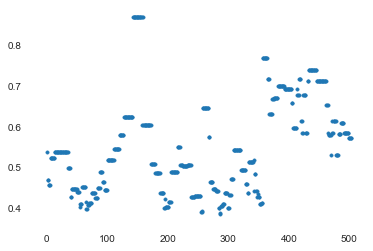

In [78]:
len_column = len(data_norm['NOX']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['NOX'], marker='.')

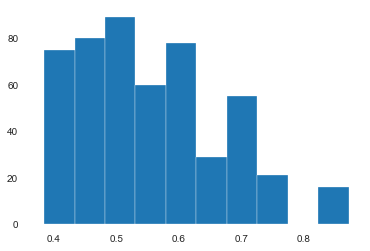

In [79]:
# plt.figure(figsize=(10,16))
plt.hist(data_norm['NOX'])
plt.show()

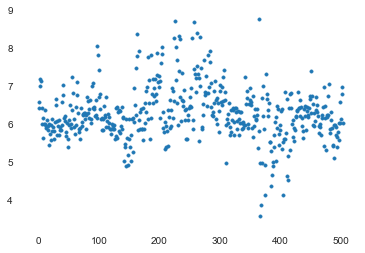

In [80]:
len_column = len(data_norm['RM']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['RM'], marker='.')

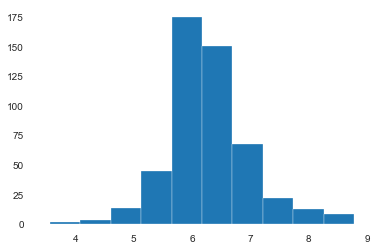

In [81]:
plt.hist(data_norm['RM'])
plt.show()

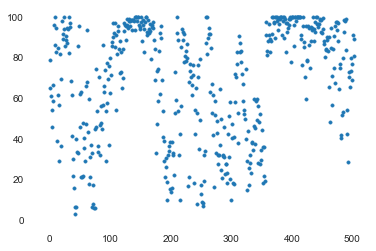

In [82]:
len_column = len(data_norm['AGE']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['AGE'], marker='.')

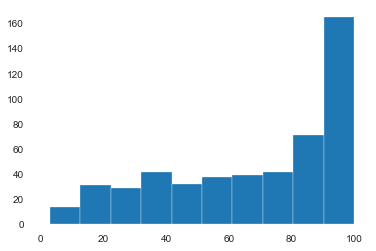

In [83]:
plt.hist(data_norm['AGE'])
plt.show()

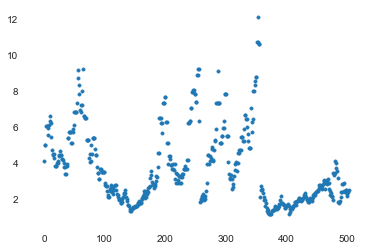

In [84]:
len_column = len(data_norm['DIS']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['DIS'], marker='.')

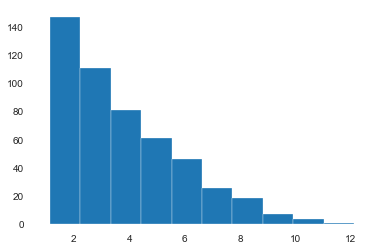

In [85]:
plt.hist(data_norm['DIS'])
plt.show()

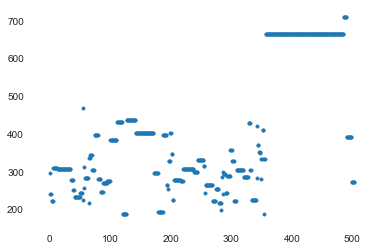

In [86]:
len_column = len(data_norm['TAX']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['TAX'], marker='.')

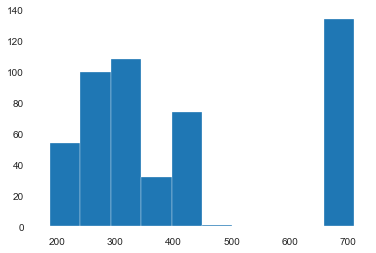

In [87]:
plt.hist(data_norm['TAX'])
plt.show()

Есть разрыв и подозрительные значения более 600 пунктов, аномалия? Рассмотрим их подробнее.

In [88]:
data_norm.TAX.value_counts()

666    129
307     40
403     30
437     15
304     14
      ... 
280      1
313      1
351      1
422      1
285      1
Name: TAX, Length: 66, dtype: int64

In [89]:
data_norm[data_norm.TAX > 500].TAX.value_counts()

666    129
711      5
Name: TAX, dtype: int64

In [90]:
data_norm.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,more_then_25k_sqft
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0,1
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6,0
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7,0
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4,0
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2,0


In [91]:
df_stage = data_norm[data_norm.TAX > 500]
df_stage.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,more_then_25k_sqft
356,8.98296,0.0,18.1,1,0.77,6.212,97.4,2.1222,24,666,20.2,377.73,17.60,17.8,0
357,3.84970,0.0,18.1,1,0.77,6.395,91.0,2.5052,24,666,20.2,391.34,13.27,21.7,0
358,5.20177,0.0,18.1,1,0.77,6.127,83.4,2.7227,24,666,20.2,395.43,11.48,22.7,0
359,4.26131,0.0,18.1,0,0.77,6.112,81.3,2.5091,24,666,20.2,390.74,12.67,22.6,0
360,4.54192,0.0,18.1,0,0.77,6.398,88.0,2.5182,24,666,20.2,374.56,7.79,25.0,0


В рассматриваемую выборку по TAX попало более 129 значений. Это слишком большое количество, чтобы просто "исключить" эти объекты из выборки. 

In [92]:
df_stage.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,more_then_25k_sqft
count,134.000000,134.0,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.00000,134.0
mean,10.854881,0.0,18.459701,0.059701,0.669858,6.001813,89.803731,2.065805,23.253731,667.679104,20.196269,291.597239,18.638806,16.45597,0.0
std,8.689648,0.0,1.833913,0.237822,0.061698,0.715604,12.547338,0.609291,3.804798,8.560796,0.019024,143.221437,6.937328,8.45579,0.0
min,0.105740,0.0,18.100000,0.000000,0.532000,3.561000,40.300000,1.129600,4.000000,666.000000,20.100000,0.320000,2.960000,5.00000,0.0
25%,5.330072,0.0,18.100000,0.000000,0.614000,5.664250,85.575000,1.608850,24.000000,666.000000,20.200000,218.357500,14.145000,11.55000,0.0
50%,8.568445,0.0,18.100000,0.000000,0.693000,6.157000,94.400000,1.943400,24.000000,666.000000,20.200000,373.740000,18.040000,14.55000,0.0
75%,13.854575,0.0,18.100000,0.000000,0.713000,6.409750,98.775000,2.414400,24.000000,666.000000,20.200000,395.232500,23.262500,19.90000,0.0
max,51.135800,0.0,27.740000,1.000000,0.770000,8.780000,100.000000,4.098300,24.000000,711.000000,20.200000,396.900000,37.970000,50.00000,0.0


Исключим аномальные объекты со значением TAX 666.

In [93]:
data_norm = data_norm[(data_norm['TAX'] != 666)]

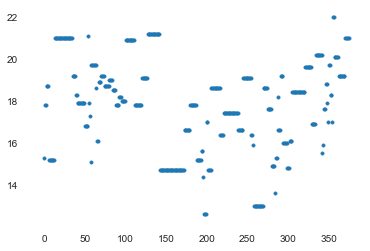

In [94]:
len_column = len(data_norm['PTRATIO']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['PTRATIO'], marker='.')

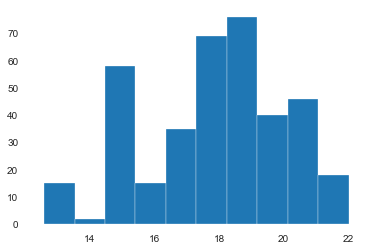

In [95]:
plt.hist(data_norm['PTRATIO'])
plt.show()

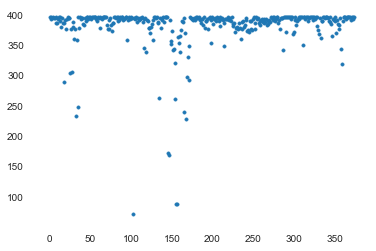

In [96]:
len_column = len(data_norm['B']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['B'], marker='.')

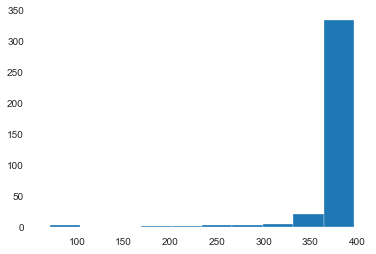

In [97]:
plt.hist(data_norm['B'])
plt.show()

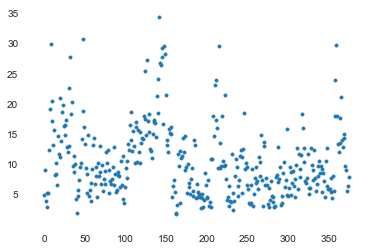

In [98]:
len_column = len(data_norm['LSTAT']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['LSTAT'], marker='.')

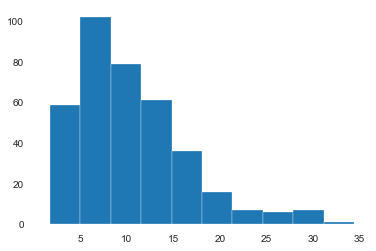

In [99]:
# plt.figure(figsize=(10,16))
plt.hist(data_norm['LSTAT'])
plt.show()

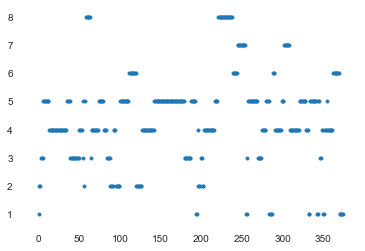

In [100]:
len_column = len(data_norm['RAD']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['RAD'], marker='.')

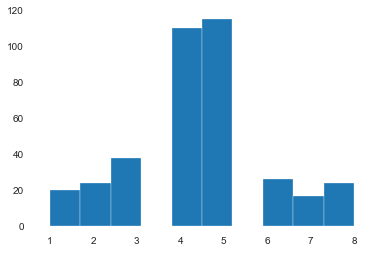

In [101]:
plt.hist(data_norm['RAD'])
plt.show()

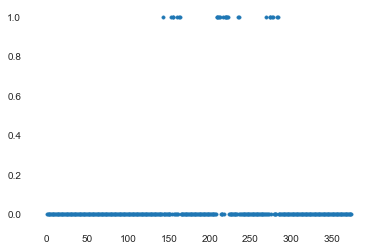

In [102]:
len_column = len(data_norm['CHAS']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['CHAS'], marker='.')

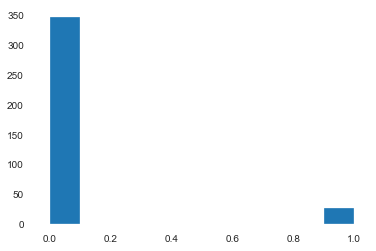

In [103]:
plt.hist(data_norm['CHAS'])
plt.show()

Переменная CHAS представляет собой "флаг", оставим. 

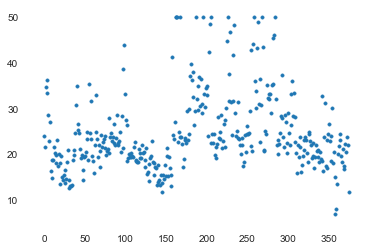

In [104]:
len_column = len(data_norm['MEDV']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['MEDV'], marker='.')

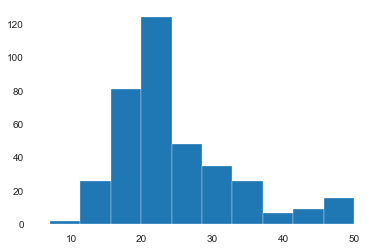

In [105]:
# plt.figure(figsize=(10,16))
plt.hist(data_norm['MEDV'])
plt.show()

In [106]:
data_norm[data_norm.MEDV > 40].MEDV.value_counts()

50.0    11
44.8     1
42.3     1
41.3     1
46.7     1
43.8     1
41.7     1
45.4     1
43.1     1
48.8     1
42.8     1
46.0     1
48.3     1
43.5     1
44.0     1
48.5     1
Name: MEDV, dtype: int64

Частотный график признака MEDV очень напоминает "нормальное распределение", но есть проблема "хвоста" с большим количеством значений = 50. 

Возможно это начало какой-то иной группы объектов, не попавших в выборку. ВОзможно какая-то ошибка. 

В нашем датасете исключим эти значения. 

In [107]:
data_norm = data_norm[(data_norm['MEDV'] < 50)]

Навскидку выбросить какие-либо признаки как незначительные оп логическим основаниям не удалось. 

Посмотрим наличие сильной взаимной скоррелированности признаков между собой при помощи HeatMap.

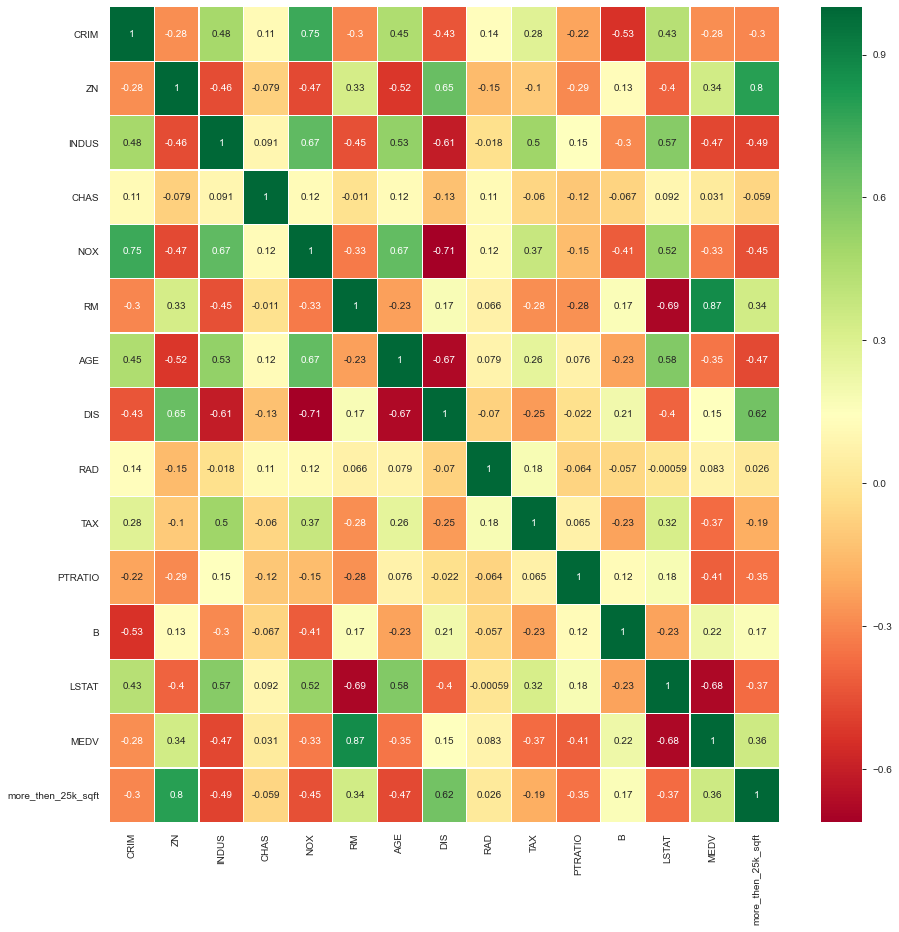

In [108]:
sns.heatmap(data_norm.corr(),annot=True,cmap='RdYlGn',linewidths=0.2)
fig=plt.gcf()
fig.set_size_inches(15,15)
plt.show()

Наиболее скоррелированные признаки по матрице корреляций:
- 0.90 RAD & TAX
- -0.77 DIS & NOX
- -0.75 DIS & AGE
- 0.73 NOX & AGE
- 0.68 CRIM & TAX

По моему мнению логически могут иметь зависимость показатели DIS & NOX; чем ближе к основным центрам занятости, тем большее количество выбросов в воздухе, сам центр застройи старее. Показатели AGE, NOX попробуем исключить из признаков.

По остальным признакам сделать такой вывод нет оснований.

In [109]:
data_norm = data_norm.drop(['AGE','NOX'], axis=1)

Так как среди признаков есть как количественные, так и булевые - 1/0 для признака CHAS, то приведем данные к виду [-1/1] для дальнейшей трансформации при помощи min_max_scaler.

### Normilize

In [110]:
headers = list(data_norm.columns.values)

In [111]:
df_to_norm = data_norm.loc[:,headers]

In [112]:
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler(feature_range=(-1,1))

np_scaled = min_max_scaler.fit_transform(df_to_norm)
df_norm = pd.DataFrame(np_scaled)
df_norm.columns = headers
df_norm.head()

,CRIM,ZN,INDUS,CHAS,RM,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,more_then_25k_sqft
0,-1.000000,-0.64,-0.883704,-1.0,-0.043205,-0.487566,-1.000000,-0.583969,-0.425532,1.000000,-0.814986,-0.186603,1.0
1,-0.989739,-1.00,-0.531111,-1.0,-0.131330,-0.325214,-0.714286,-0.790076,0.106383,1.000000,-0.558434,-0.301435,-1.0
2,-0.989748,-1.00,-0.531111,-1.0,0.305866,-0.325214,-0.714286,-0.790076,0.106383,0.975038,-0.873574,0.325359,-1.0
3,-0.987265,-1.00,-0.893333,-1.0,0.198856,-0.122509,-0.428571,-0.866412,0.297872,0.986078,-0.940796,0.263158,-1.0
4,-0.969333,-1.00,-0.893333,-1.0,0.284120,-0.122509,-0.428571,-0.866412,0.297872,1.000000,-0.793401,0.397129,-1.0


### Learn & predict

Составим модель линейной регрессии для нескольких переменных. 

In [113]:
from sklearn import linear_model

В качестве набора признаков модели передадим всё, кроме 'MEDV'.
В качестве целевого признака выделим MEDV. 

In [114]:
X = df_norm.drop('MEDV', axis=1)
Y = df_norm['MEDV']

При помощик train_test_split разобьем нашу модель на обучающие и проверочные данные с пропорцией 80 и 20 %. 

In [115]:
from sklearn.model_selection import train_test_split

# x = medv,
# y = lstat
X_train, X_test, y_train, y_test = train_test_split(
    X,
    Y,
    test_size = 0.2
)

Обучим нашу модель на тренировочных данных и попробуем предсказать значение MEDV. 

In [116]:
model = linear_model.LinearRegression()
model.fit(X_train, y_train)

print('Intercept: \n', model.intercept_)
print('Coefficients: \n', model.coef_)

predicted_y = model.predict(X_test)

Intercept: 
 -0.278329472327453
Coefficients: 
 [-1.84048509e-02  1.18032782e-01 -2.90390950e-02  4.81061174e-04
  6.65865340e-01 -1.34987390e-01  5.25309698e-02 -1.80219915e-01
 -1.44569372e-01  9.98685165e-02 -1.17871552e-01 -2.74495221e-02]


Оценим модель при помощи rmse & mae

In [117]:
from sklearn.metrics import mean_squared_error

mse = mean_squared_error(y_test, predicted_y)
rmse = np.sqrt(mse)
print(f'Model rmse is: {rmse}')

Model rmse is: 0.14414621059893917


In [118]:
from sklearn.metrics import mean_absolute_error as mae

accuracy = mae(y_test, predicted_y)
print(f'Model mae is: {accuracy}')

Model mae is: 0.12149294943259159


Показатель score модели достаточно невысок. Необходимо продолжать работу над моделью или её признаками.

### Denormilize - back to common

Приведем полученные предсказания в исходную размерность при помощи операции .inverse_transform. 

In [119]:
df_prediction = X_test.copy()
df_prediction.loc[:, 'MEDV'] = predicted_y

In [120]:
df_back_to_denorm = min_max_scaler.inverse_transform(df_prediction)

In [121]:
df_back_to_denorm = pd.DataFrame(df_back_to_denorm)
df_back_to_denorm.columns = headers
df_back_to_denorm.head()

,CRIM,ZN,INDUS,CHAS,RM,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,more_then_25k_sqft
0,0.79041,0.0,9.90,0.0,6.122,2.6403,4.0,304.0,18.4,396.90,5.98,7.0,0.399507
1,0.98843,0.0,8.14,0.0,5.813,4.0952,4.0,307.0,21.0,394.54,19.88,7.0,0.231199
2,0.20746,0.0,27.74,0.0,5.093,1.8226,4.0,711.0,20.1,318.43,29.68,7.0,-0.079185
3,0.04684,0.0,3.41,0.0,6.417,3.0923,2.0,270.0,17.8,392.18,8.81,7.0,0.454570
4,0.04981,21.0,5.64,0.0,5.998,6.8147,4.0,243.0,16.8,396.90,8.43,48.8,0.365664
